In [1]:
import sys
import operator
import parse as p
import author_network as an
import regression as re
import numpy as np
import networkx as nx
import graphviz as gv
from matplotlib import pyplot as plt
from community import community_louvain
import collections
from node2vec import Node2Vec

### Reading File

In [2]:
#files = ['../data/icml2019.json', '../data/icml2018.json','../data/icml2017.json']
files = ['../data/icml2019.json', '../data/icml2018.json']
years = '(2018, 2019)'

author_list, paper_list = p.parse_json(files)

In [3]:
temp, temp1 = p.get_paper_count(author_list)
authors = temp[0]
counts = temp[1]
sorted_authors = temp1[0]
sorted_counts = temp1[1]

### Author who published the most papers

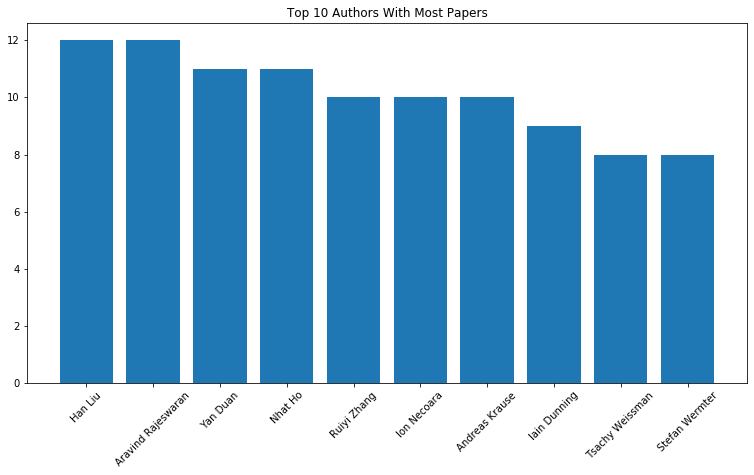

In [4]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar(sorted_authors[:10],sorted_counts[:10], width = 0.8)
plt.title('Top 10 Authors With Most Papers')
plt.savefig('../image/authors_with_most_papers'+years+'.pdf', bbox_inches='tight')
plt.show()

###  Author who has been working with the most people

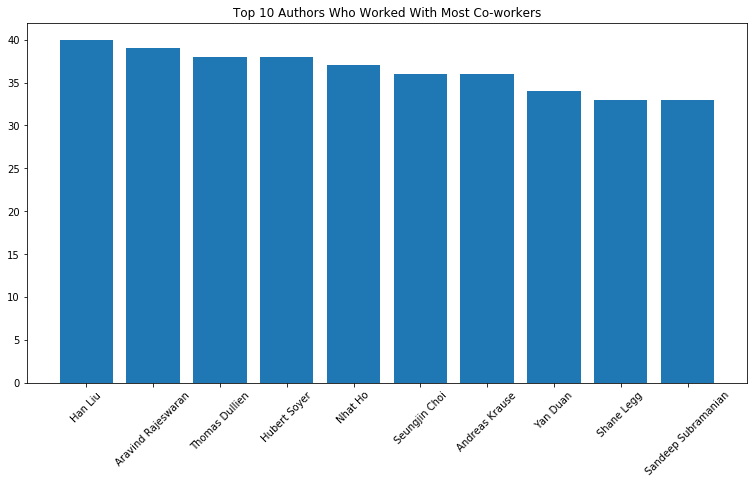

In [5]:
co_count_authors, co_counts = an.co_worker_counts(author_list)
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar(co_count_authors[:10],co_counts[:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Most Co-workers')
plt.savefig('../image/authors_working_with_most_people'+years+'.pdf', bbox_inches='tight')
plt.show()

### Community Detection (Louvain algorithm)

In [6]:
edges, alone = an.get_edges(author_list, paper_list)
G = nx.MultiGraph()
G.add_edges_from(edges)
G.add_nodes_from(alone)
partition = community_louvain.best_partition(G)


In [7]:
# Adding number of papers attribute
for i in range(len(authors)):
    G.nodes[authors[i]]['papers'] = counts[i]

In [8]:
values = [partition.get(node) for node in G.nodes()]
counter = collections.Counter(values)

### Author who has been working with the most research groups
### 1) Simply counted version

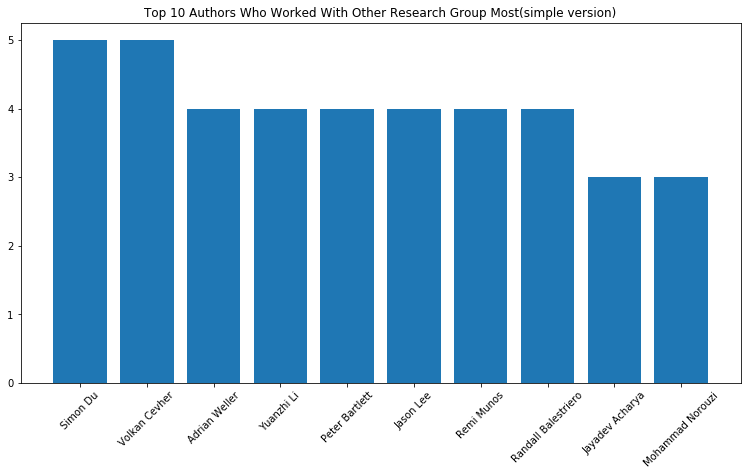

In [9]:
other_group = an.find_other_group(G, values, author_list)
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar([x[0] for x in other_group ][:10], [x[1] for x in other_group ][:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Other Research Group Most(simple version)')
plt.savefig('../image/authors_with_most_research_groups_simple'+years+'.pdf', bbox_inches='tight')
plt.show()

### 2) Betweeness centrality

In [10]:
G_b = nx.Graph()
G_b.add_edges_from(edges)
G_b.add_nodes_from(alone)

# Adding number of papers attribute
for i in range(len(authors)):
    G_b.nodes[authors[i]]['papers'] = counts[i]

In [11]:
Cb_dict = nx.betweenness_centrality(G_b)
Cb = sorted(Cb_dict.items(), key=operator.itemgetter(1), reverse = True)

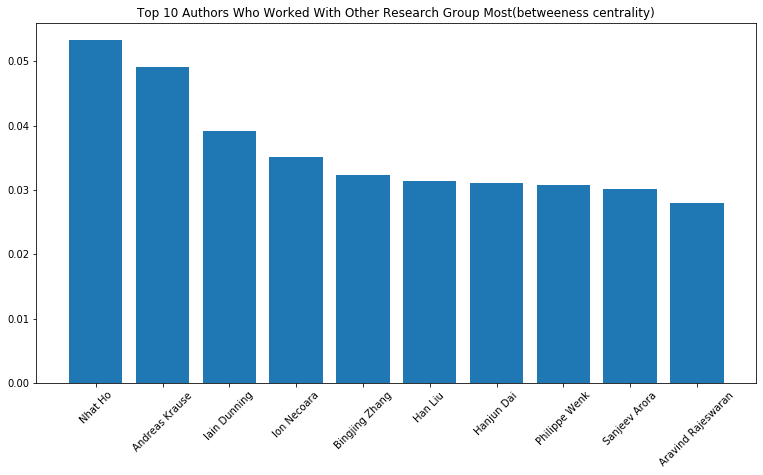

In [12]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar([x[0] for x in Cb][:10], [x[1] for x in Cb][:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Other Research Group Most(betweeness centrality)')
plt.savefig('../image/authors_with_most_research_groups_betweeness'+years+'.pdf', bbox_inches='tight')
plt.show()

### Research groups

In [13]:
total_groups, G_g = an.make_research_groups(G, values)

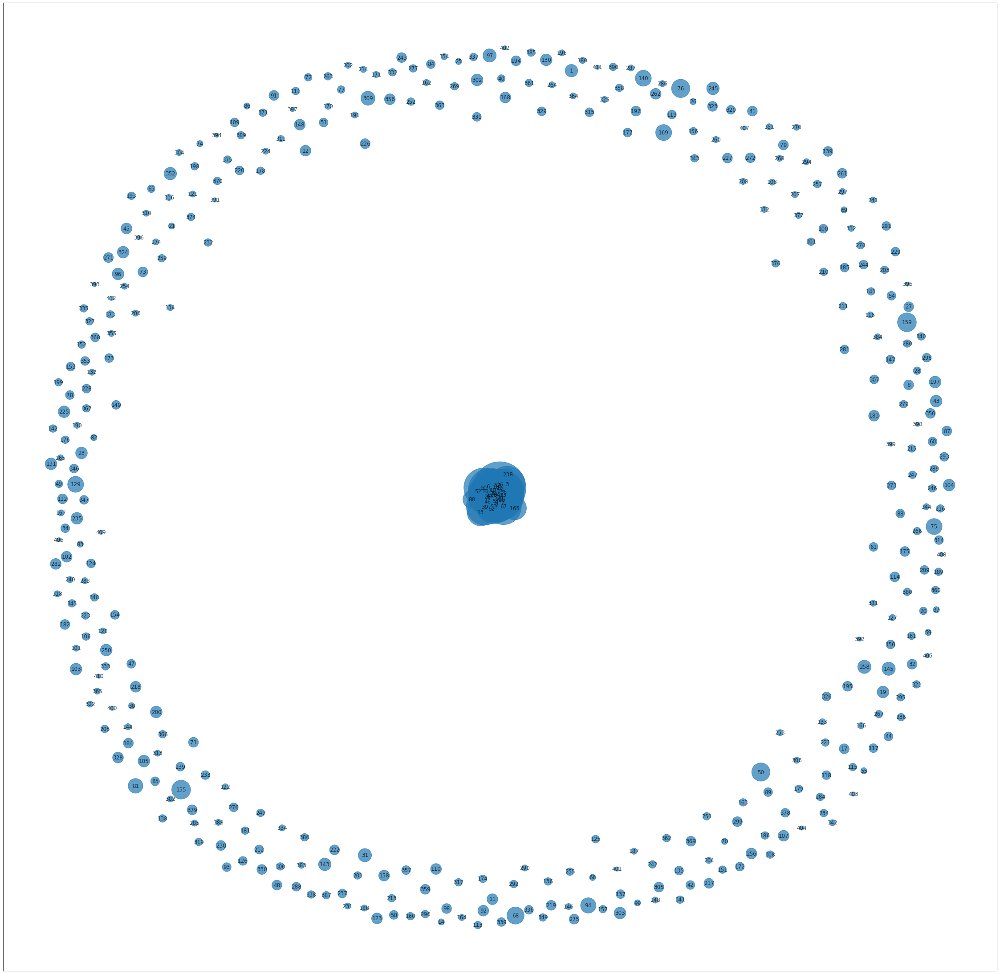

In [14]:
plt.figure(figsize =(40,40))
sp = nx.spring_layout(G_g)
node_size = [100 * len(total_groups[an.find_group(ID, total_groups)].authors) for ID in G_g] 
nx.draw_networkx(G_g,
                 pos=sp, 
                 with_labels=True, 
                 node_size=node_size, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.savefig('../image/network_graph_research_group'+years+'.pdf', bbox_inches='tight')
plt.show()

### Top Research Groups

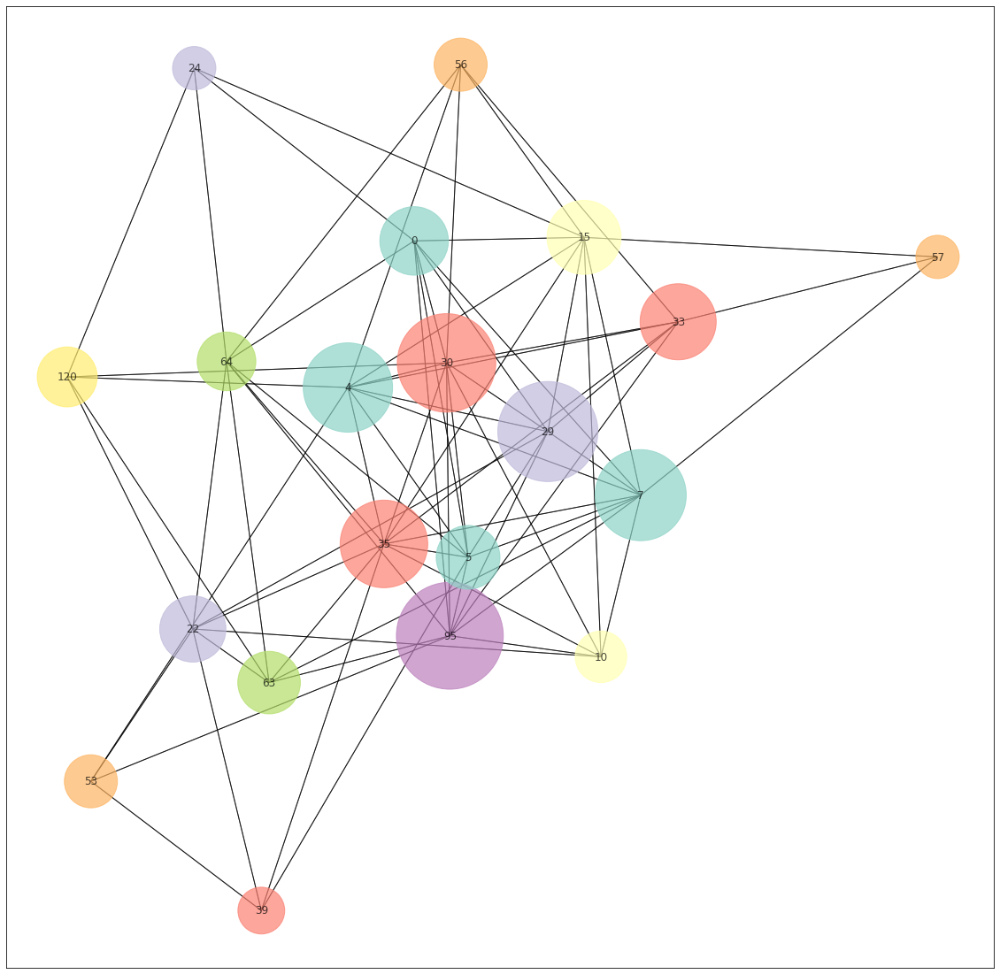

In [15]:
for group in total_groups:
    group.add_all_paper(author_list)

G_r, r_groups = an.get_top_group(G, total_groups, 20)

plt.figure(figsize =(20,20))
sp = nx.spring_layout(G_r)
node_size = [200 * nx.get_node_attributes(G_r, 'authors')[v] for v in G_r] 
nx.draw_networkx(G_r,
                 pos=sp, 
                 with_labels=True, 
                 node_size=node_size, 
                 node_color=G_r,
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.savefig('../image/network_graph_top_research_groups'+years+'.pdf', bbox_inches='tight')
plt.show()

### Network Graph - Louvain algorithm

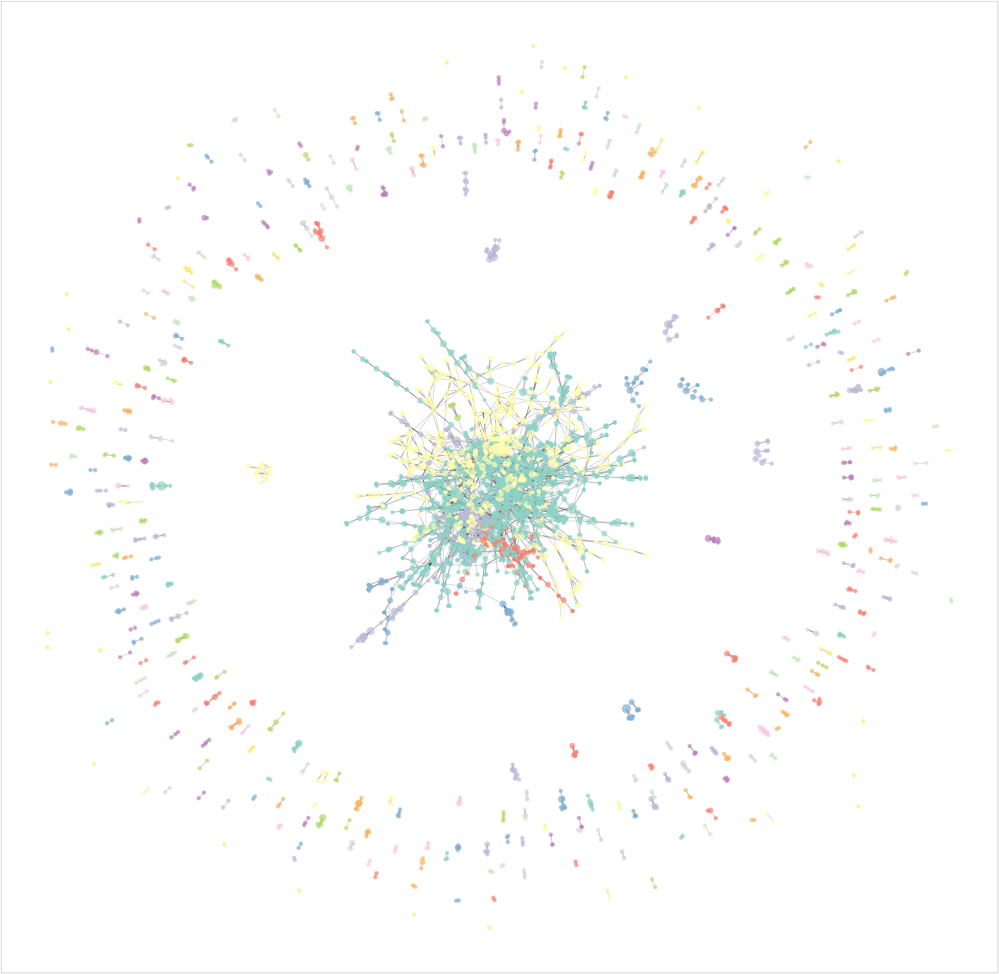

In [21]:
plt.figure(figsize =(100,100))
sp = nx.spring_layout(G)
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=values, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.savefig('../image/network_graph_Louvain1'+years+'.pdf', bbox_inches='tight')
plt.show()

#### Coloring top 10 authors with most papers

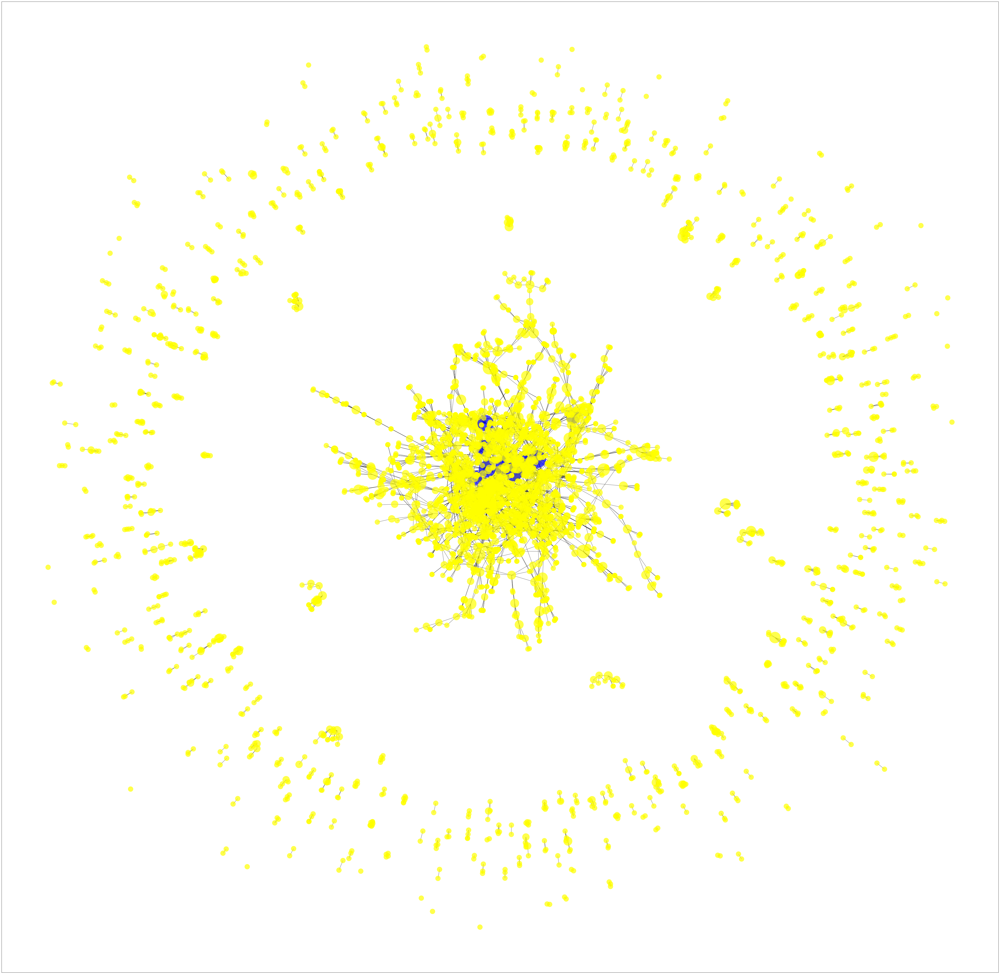

In [17]:
new_colormap = an.make_colormap(G, sorted_authors, author_list, 10)

plt.figure(figsize =(80,80))
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G, 
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=new_colormap, 
                 alpha=0.7
                )
# plt.axes('off')
plt.savefig('../image/network_graph_top_paper'+years+'.pdf', bbox_inches='tight')
plt.show()

#### Coloring top 10 authors working with most research groups 

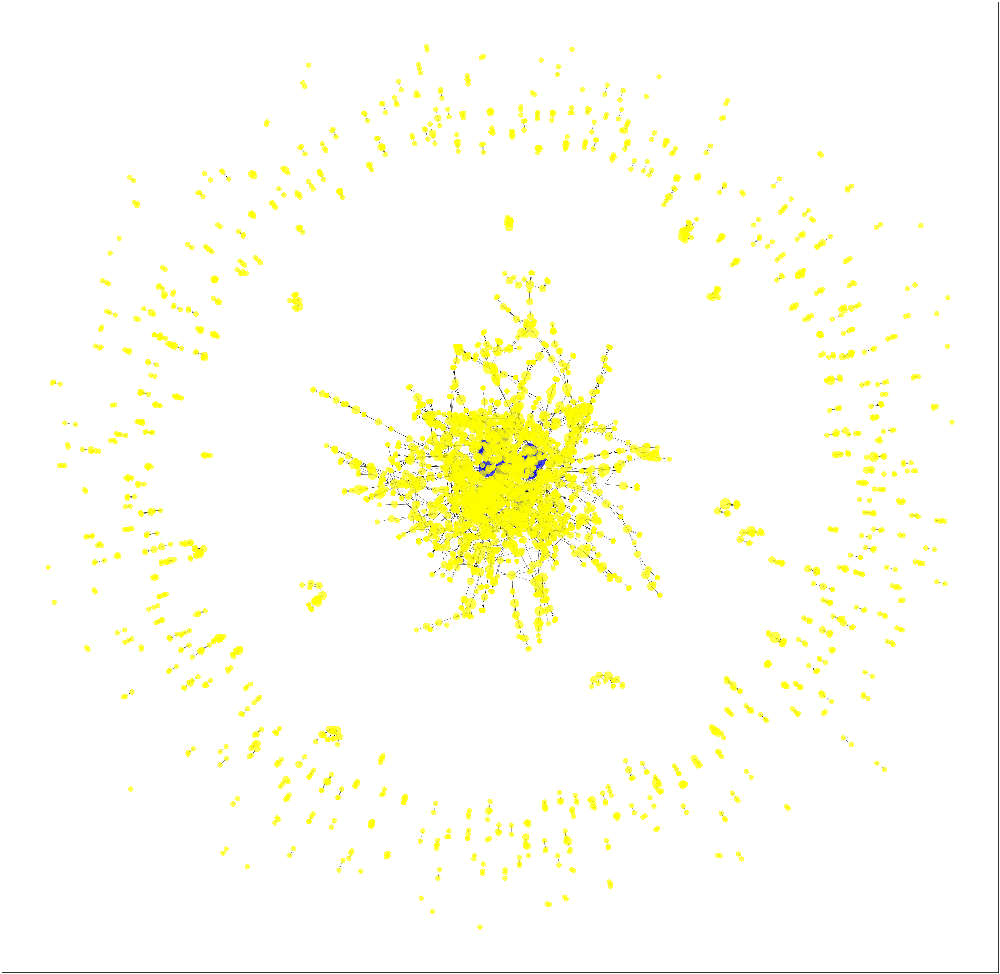

In [18]:
new_colormap = an.make_colormap(G, [x[0] for x in Cb], author_list, 10)

plt.figure(figsize =(80,80))
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G, 
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=new_colormap, 
                 alpha=0.7
                )
# plt.axes('off')
plt.savefig('../image/network_graph_top_most_RG'+years+'.pdf', bbox_inches='tight')
plt.show()

#### Get top 5 research groups(Louvain algorithm)

586


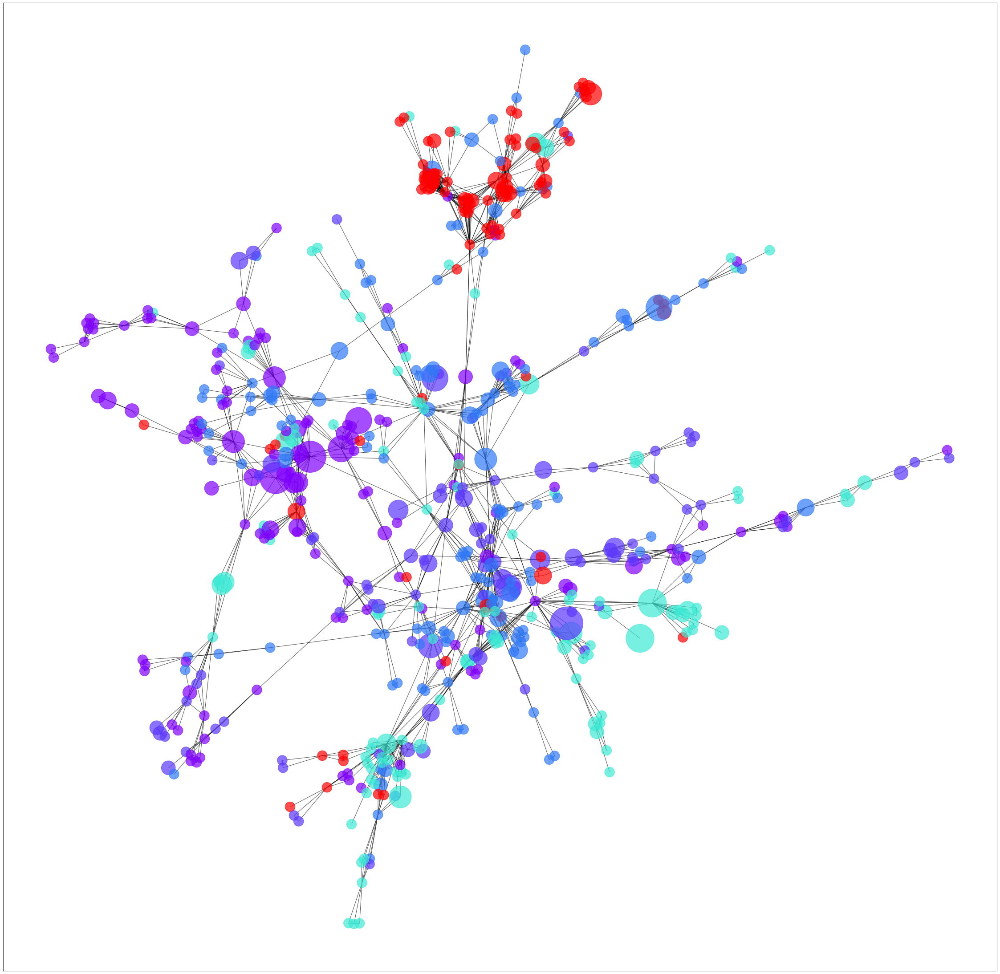

In [20]:
G_r, r_values = an.get_edges_from_values(G, values, counts, author_list, paper_list, 5)

plt.figure(figsize =(40,40))
sp = nx.spring_layout(G_r)
node_size = [500 * nx.get_node_attributes(G_r, 'papers')[v] for v in G_r] 
nx.draw_networkx(G_r,
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=r_values, 
                 alpha=0.7,
                 cmap = plt.cm.rainbow
                )
# plt.axes('off')
plt.savefig('../image/network_graph_top_RG_Louvain'+years+'.pdf', bbox_inches='tight')
plt.show()

### Network Graph - node2vec and k-means algorithm

In [13]:
node2vec = Node2Vec(graph=G, # target graph
                    dimensions=50, # embedding dimension
                    walk_length=10, # number of nodes in each walks 
                    p = 1, # return hyper parameter
                    q = 0.0001, # inout parameter, q값을 작게 하면 structural equivalence를 강조하는 형태로 학습됩니다. 
                    weight_key=None, # if weight_key in attrdict 
                    num_walks=2000, 
                    workers=1,
                   )

for i, each_walk in enumerate(node2vec.walks):
    print(f"{i:0>2d}, {each_walk}")
    if i>1:
        break

Generating walks (CPU: 1): 100%|██████████| 2000/2000 [2:31:02<00:00,  4.53s/it]      


00, ['Jacob Gardner', 'Andrew Gordon Wilson', 'Christopher Fifty', 'Amauri Souza', 'Polina Kirichenko', 'Himanshu Tyagi', 'Yuwei Hu', 'Himanshu Tyagi', 'Tri Dao', 'Matthew Eichhorn']
01, ['Arthur Mensch', 'Vlad Niculae', 'Arthur Mensch', 'Michael Carbin', 'Charith Mendis', 'Alex Renda', 'Michael Carbin', 'Arthur Mensch', 'Andre Martins', 'Vlad Niculae']
02, ['Yi-An Ma', 'Samuel K. Ainsworth', 'Emily B. Fox', 'Ahmed M. Alaa', 'Emily B. Fox', 'Gerhard Neumann', 'Riad Akrour', 'Gerhard Neumann', 'Mihaela Schaar', 'Gerhard Neumann']


In [14]:
# 발생한 walk를 사용해서 학습을 시켜봅니다. 
# 여기서 fitting할때 사용하는 argument는 gensim의 word2vec과 같습니다. 
# 단 학습시킨 것을 model1처럼 어디에 집어넣어줘야 하는 것 같네요. 여기서 p나 q값을 조절하기는 어려운 것 같습니다. 
model1 = node2vec.fit(window=2)

In [15]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

In [16]:
model1 = node2vec.fit(window=10)
# kmeans clustering을 진행해줍니다. 

In [17]:
K = 5
kmeans = KMeans(n_clusters=K, random_state=0).fit(model1.wv.vectors)
# node의 cluster 부분을 attrdict에 업데이트해줍니다. 
for n, label in zip(model1.wv.index2entity, kmeans.labels_):
    G.nodes[n]['label'] = label
    

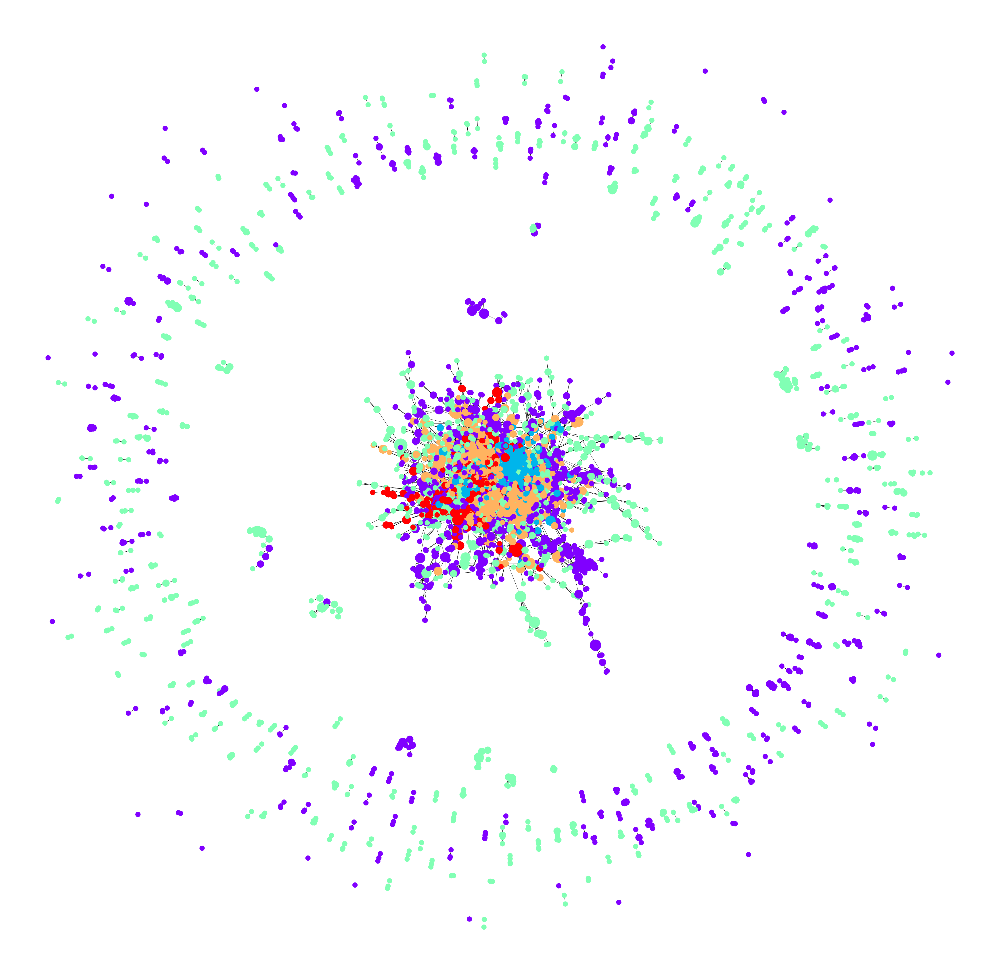

In [18]:
# 그림을 그려줍니다.
plt.figure(figsize=(80, 80))
nx.draw_networkx(G, pos=nx.layout.spring_layout(G), node_size=node_size,
                 node_color=[n[1]['label'] for n in G.nodes(data=True)], with_labels=False,
                 cmap=plt.cm.rainbow
                )
plt.axis('off')
plt.savefig('../image/network_graph_node2vec_kmeans'+years+'.pdf', bbox_inches='tight')
plt.show()